# Notebook 2: Generate Residence Centroids, determine `d1` and visualize centroids and nearest OSMNx nodes

## Introduction to Notebook 2

**Important Note**: For this notebook, you will select a parish as the study area for street networks. If you want to select which parish to study, run each cell (one at a time) beginning from this one. 

Our goal within the next three notebooks is to derive the values of four distances:
1. `d1` - distance between a Parish residence centroid and the closest OSMNx node
2. `d2` - distance between a testing facility and the closest OSMNx node
3. `d3` - the shortest distance (and route) between the OSMNx nodes (parish residence and testing facility)
4. `d_total` - the sum of `d1`, `d2`, and `d3`

Terms to remember:
1. Graph - OSMNx street network graph represented as a NetworkX multidimensional graph. The Graph can be projected to enable distance measurements. OSMNx Graphs have nodes and edges.
2. Graph nodes - OSMNx nodes
3. Graph edge - OSMNx edges
4. Parish nodes - origin point (x, y) for a parish residential unit
5. Test site (facility) node - destination point (x, y) for a testing facility

<img src="images/d1-d2-d3.jpeg" alt="d1-d2-d3 image" width="700"/>

## Data sources for this notebook

### Data Source: GADM

Download page: https://gadm.org/download_country_v3.html  Use GeoPackage link.

What is GeoPackage? https://www.geopackage.org/

### Download Uganda geopackage

In [1]:
import os

In [2]:
if not os.path.exists('data/gadm36_UGA.gpkg'):
    if not os.path.exists('data/gadm_gpkg.zip'):
        os.system('wget https://biogeo.ucdavis.edu/data/gadm3.6/gpkg/gadm36_UGA_gpkg.zip -O data/gadm_gpkg.zip')
    os.system('unzip data/gadm_gpkg.zip -d data')

### Load Uganda GeoPackage as a GeoPandas GeoDataFrame (GDF)

> **Review:**
>  
> What is GeoPandas? https://geopandas.org/
>  
> What is the difference between Pandas and GeoPandas?
>  
> What is GADM? https://gadm.org/

In [3]:
import geopandas as gpd, pandas as pd, matplotlib.pyplot as plt

pd.options.display.float_format = '{:.10f}'.format

Let's load the GADM geopackage for Uganda that has level 4 administrative units, check GeoDataFrame `info` and do a quick `plot`.

In [4]:
uganda_gdf = gpd.read_file('data/gadm36_UGA.gpkg')

uganda_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5341 entries, 0 to 5340
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   GID_0      5341 non-null   object  
 1   NAME_0     5341 non-null   object  
 2   GID_1      5341 non-null   object  
 3   NAME_1     5341 non-null   object  
 4   GID_2      5341 non-null   object  
 5   NAME_2     5341 non-null   object  
 6   GID_3      5341 non-null   object  
 7   NAME_3     5341 non-null   object  
 8   GID_4      5341 non-null   object  
 9   NAME_4     5341 non-null   object  
 10  VARNAME_4  0 non-null      object  
 11  TYPE_4     5341 non-null   object  
 12  ENGTYPE_4  5341 non-null   object  
 13  CC_4       0 non-null      object  
 14  geometry   5341 non-null   geometry
dtypes: geometry(1), object(14)
memory usage: 626.0+ KB


<AxesSubplot:>

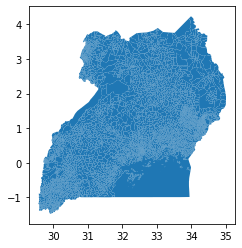

In [5]:
uganda_gdf.plot()

### Select a parish to study

To enable us to save on resources, we will scope down our street network analysis to one of Kampala's parishes. Kampala is the orange polygon on the map below.

In [6]:
parishes_gdf = uganda_gdf[uganda_gdf['NAME_1']=='Kampala'].copy()

We do not need to display the boundaries of Kampala's parishes so let's `dissolve` the boundaries for now.

In [7]:
kampala_boundary_gdf = parishes_gdf[['NAME_1', 'geometry']].dissolve(by='NAME_1')

Now, let's superimpose the Kampala polygon on the larger map of Uganda below.

<AxesSubplot:title={'center':'Kampala, Uganda'}>

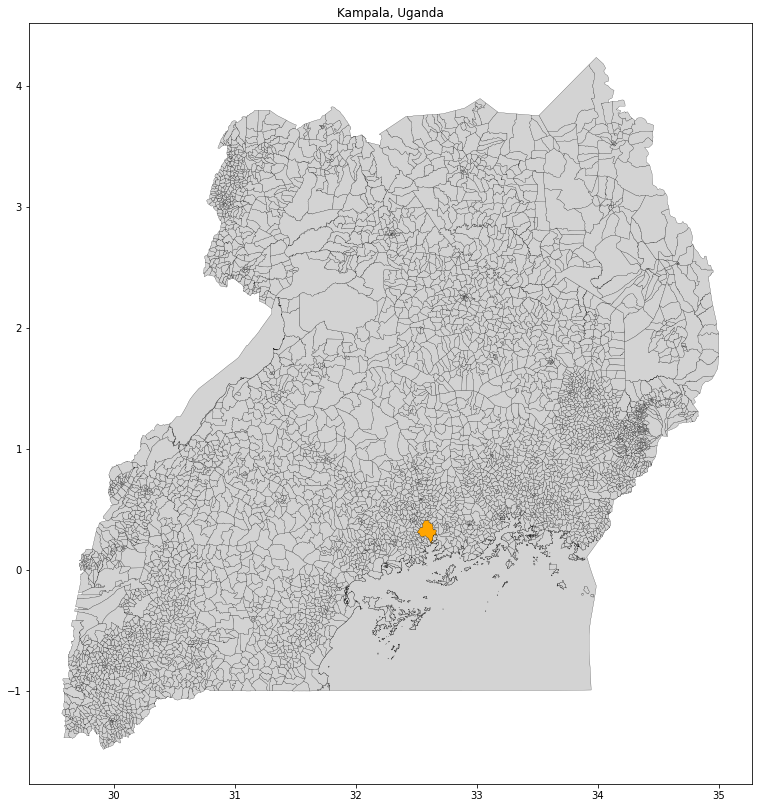

In [8]:
fig, ax1 = plt.subplots(figsize=(28, 14))
plt.title('Kampala, Uganda')
uganda_gdf.geometry.plot(ax=ax1,color='lightgray', edgecolor='black', linewidth=0.2)
kampala_boundary_gdf.plot(ax=ax1, color='orange', edgecolor='black', linewidth=0.2)

In [9]:
parishes_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The map below shows the Kampala orange polygon with its parish boundaries.

<AxesSubplot:title={'center':'96 Parishes in Kampala'}>

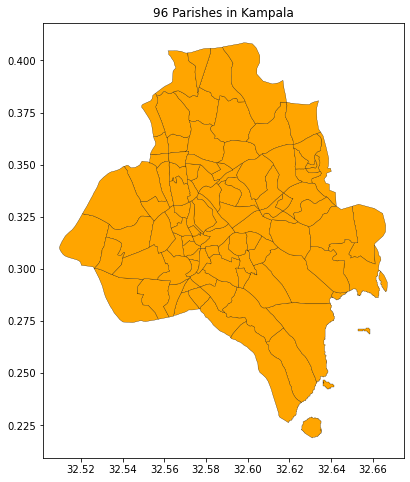

In [10]:
fig, ax1 = plt.subplots(figsize=(16, 8))
plt.title('96 Parishes in Kampala')
parishes_gdf.plot(ax=ax1, color='orange', edgecolor='black', linewidth=0.25)

In Notebook 1, we obtained the EPSG authority code of the projected graph. We will use that the same EPSG code here again.

In [11]:
import yaml

with open("proj_crs.yml", "r") as stream:
    try:
        epsg_dict = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
        
proj_epsg_str = str(epsg_dict).replace("{","").replace("}", "").replace("'","").replace(" ","")

print('Projected graph EPSG code:',proj_epsg_str)

Projected graph EPSG code: EPSG:32636


We will obtain two sets of values from the parishes GDF by projecting this using the EPSG code from the projected graph:
1. Area in sq. m. for each parish polygon (We will use this measure later as a Folium popup for each parish polygon.)
2. Centroid X and Y coordinates

In [12]:
parishes_gdf['area_sqm'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].area

In [13]:
parishes_gdf['centroid_x'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].centroid.x
parishes_gdf['centroid_y'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].centroid.y

Let's check out these three new columns.

In [14]:
parishes_gdf

,GID_0,NAME_0,GID_1,NAME_1,GID_2,NAME_2,GID_3,NAME_3,GID_4,NAME_4,VARNAME_4,TYPE_4,ENGTYPE_4,CC_4,geometry,area_sqm,centroid_x,centroid_y
1391,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.1_1,Bukesa,None,Parish,Parish,None,"MULTIPOLYGON (((32.56321 0.31958, 32.56292 0.3...",559768.3975113713,451524.4166484834,35906.9724917396
1392,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.2_1,Civic Centre,None,Parish,Parish,None,"MULTIPOLYGON (((32.57724 0.30992, 32.57730 0.3...",1209455.8146584462,453884.4876301024,34880.4453069278
1393,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.3_1,Industrial Area,None,Parish,Parish,None,"MULTIPOLYGON (((32.60664 0.31585, 32.60598 0.3...",1776410.1888784864,455890.3457818956,35463.5391795589
1394,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.4_1,Kagugube,None,Parish,Parish,None,"MULTIPOLYGON (((32.57084 0.32427, 32.57058 0.3...",502708.6719317246,452030.8561209833,36273.6179740557
1395,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.5_1,Kamwokya I,None,Parish,Parish,None,"MULTIPOLYGON (((32.58500 0.34132, 32.58651 0.3...",411428.6768850113,454564.2625147337,38168.9266840896
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.9_1,Nakulabye,None,Parish,Parish,None,"MULTIPOLYGON (((32.54860 0.33223, 32.55151 0.3...",1026084.8535207562,450559.2039879204,36410.2678852486
1483,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.10_1,Namirembe,None,Parish,Parish,None,"MULTIPOLYGON (((32.56114 0.30923, 32.56108 0.3...",1859599.6021243404,450911.3264704964,35032.9390910053
1484,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.11_1,Nateete,None,Parish,Parish,None,"MULTIPOLYGON (((32.54007 0.30528, 32.53991 0.3...",1804795.3528157366,448176.4503960741,33820.1469633023
1485,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.12_1,Ndeeba,None,Parish,Parish,None,"MULTIPOLYGON (((32.57188 0.29548, 32.57166 0.2...",1962463.6518844874,451649.7161646702,33182.2916360861


As we prepare to look at some interactive maps, let's obtain the centroid for Kampala. We do this by:
1. Obtaining the `unary_union` of all parish polygons
2. We then obtain the centroid, and corresponding X and Y values and store them in a tuple, `parishes_coords`, which we will use when we create our first Folium map.

In [15]:
parishes_polygon = parishes_gdf.geometry.unary_union

parishes_coords = (parishes_polygon.centroid.y, parishes_polygon.centroid.x)

In [16]:
parishes_coords

(0.3224521993920194, 32.59300521351634)

### Folium parish explorer

**IMPORTANT:** Use the folium map below to explore the building footprints in each parish.

In [17]:
import folium

from folium import plugins

m = folium.Map(location=parishes_coords, zoom_start=13, control_scale=True)

for row in parishes_gdf.itertuples():
    # Simplify the representation of the parishes
    #    so the polygons display easily
    sim_geo = gpd.GeoSeries(row.geometry).simplify(tolerance=0.000001)
    # convert the simplified geometry to GeoJSON
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'color':'black','weight':2, 'fillColor': 'orange','fillOpacity':0.05},
                           highlight_function=lambda x: {'color':'black','weight':2, 'fillColor': 'blue','fillOpacity':0.075})
    folium.Popup('Parish: '+row.NAME_4+'<br/>'+'Area (sq. m.): '+str(row.area_sqm)).add_to(geo_j)
    geo_j.add_to(m)
    
m

### Use IPython Dropdown widget for selection of target parish

In this section we will create the bounding parish polygon to enable us to create the data set that includes OSM building footprints for that parish. Downloading all building footprints for all parishes would consume a lot of resources (RAM) - for this initial exploration we will focus on one parish.

Parishes to try:
1. Kisugu (200+ residential units)
2. Bwaise I (1000+ residential units)
3. Bukasa (1300+ residential units)
4. Kawempe I (2500+ residential units)
5. Kazo Ward (3600+ residential units)

How many parishes are there in Kampala?

**IMPORTANT STEPS:** 

1. Select the parish you want to study from the dropdown below.

In [18]:
import ipywidgets as widgets

d = widgets.Dropdown(options=parishes_gdf['NAME_4'].sort_values(), value='Kisugu', description='Parishes')

d

Dropdown(description='Parishes', index=36, options=('Banda', 'Bogolobi', 'Bukasa', 'Bukesa', 'Bukoto I', 'Buko…

Let's store the widget result to `parish_name`.

2. Run this cell below and the rest after it. (On the menu: Run `Selected Cell And All Below`) 

In [19]:
parish_name = d.value

parish_name

'Kamwokya I'

In [20]:
parish_gdf = parishes_gdf[parishes_gdf['NAME_4']==parish_name].copy()

In [21]:
parish_polygon = parish_gdf['geometry'].unary_union

In [22]:
type(parish_polygon)

shapely.geometry.polygon.Polygon

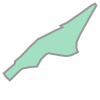

In [23]:
parish_polygon

In [24]:
parish_json = gpd.GeoSeries([parish_polygon]).__geo_interface__

In [25]:
parish_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Process OSMNx building footprints

### Set up OSMNx and Overpass API

What is OSMNx?

What is the Overpass API?

In [26]:
import osmnx as ox, csv, os

with open('overpass-api.csv', mode='r') as infile:
    reader = csv.reader(infile)
    overpass_api = {rows[0]:rows[1] for rows in reader}

ox.config(
    log_console=False, 
    use_cache=True, 
    log_file=True,
    overpass_endpoint=overpass_api['main']
)

### OSMNx building footprints in GeoPandas GeoDataFrame

References: 
1. OSMNx geometries from polygon: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_polygon
2. Open Street Map data model (nodes, ways, relations): https://labs.mapbox.com/mapping/osm-data-model/

The code below will load the building footprints cache (`footprints_gdf`). Depending on how many parishes are represented, this may take a few minutes to load.

In [27]:
%%time
# check if footprints_gdf exists:
if os.path.exists('data/footprints_gdf.gpkg'):
    footprints_gdf = gpd.read_file('data/footprints_gdf.gpkg')
else:
    footprints_gdf = gpd.GeoDataFrame()

# if parish is not in the footprints_gdf create a new gdf and append it to footprints_gdf
if (footprints_gdf.empty) or (parish_name not in footprints_gdf['parish_name'].values):
    new_gdf = ox.geometries.geometries_from_polygon(parish_polygon, tags={'building':True}).reset_index()
    if 'nodes' in new_gdf.columns:
        new_gdf['nodes'] = new_gdf['nodes'].astype(str)
    if 'ways' in new_gdf.columns:
        new_gdf['ways'] = new_gdf['ways'].astype(str)
    new_gdf['parish_name'] = parish_name
    footprints_gdf = footprints_gdf.append(new_gdf, ignore_index=True)
    footprints_gdf.to_file('data/footprints_gdf.gpkg', driver='GPKG')

/opt/conda/lib/python3.9/site-packages/osmnx/utils_geo.py:335: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
/opt/conda/lib/python3.9/site-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


CPU times: user 4min 47s, sys: 2.03 s, total: 4min 49s
Wall time: 5min 19s


In [28]:
footprints_gdf['parish_name'].unique()

array(['Kisugu', 'Kasubi', 'Mutungo', 'Bukasa', 'Kibuye I', 'Ggaba',
       'Kabowa', 'Kawempe I', 'Bogolobi', 'Bwaise I', 'Kazo Ward',
       'Makerere I', 'Nakulabye', 'Luwafu', 'Busega', 'Mutundwe',
       'Kamwokya I'], dtype=object)

### Using GeoPandas `explore()` (Folium Map)

Reference: https://geopandas.org/docs/user_guide/interactive_mapping.html

In [29]:
map1 = footprints_gdf[footprints_gdf['parish_name']==parish_name].explore()

map1

### Select GeoDataFrame columns to use

In [30]:
filtered_buildings_gdf = footprints_gdf[footprints_gdf['parish_name']==parish_name][['parish_name','building','geometry']].copy()

### Select residential building types

What are building types in OSM? https://wiki.openstreetmap.org/wiki/Key:building

Let's look at the building types in this GDF.

In [31]:
filtered_buildings_gdf['building'].unique()

array(['yes', 'office', 'church'], dtype=object)

Add anything new in the list above that looks like a residential unit to the `include_list` below. The building type `yes` are for untagged buildings - learn more about it from this page: https://wiki.openstreetmap.org/wiki/Tag:building%3Dyes. Note there may be misspelled terms.

In [32]:
include_list = ['residential', 'dormitory', 'duplex', 'apartments', 'apartment', 'house', \
                'Tent', 'tent', 'semidetached_house', 'bungalow', 'detached', 'terrace', \
                'hut','settlment']

If you include `yes` as building type in the `include list` below, this will potentially include untagged commercial and other non-residential type buildings.

In [37]:
%%time

include_yes = False
if include_yes:
    residential_gdf = filtered_buildings_gdf[filtered_buildings_gdf['building'].isin(include_list + ['yes'])].copy()
    print('Records with "yes" building type:')
    print(residential_gdf.shape[0])
else:
    residential_gdf = filtered_buildings_gdf[filtered_buildings_gdf['building'].isin(include_list)].copy()
    print('Records without "yes" building type:')
    print(residential_gdf.shape[0])
    if residential_gdf.shape[0] == 0:
        print('No records found if building type = "yes", including "yes" in filtering.')
        residential_gdf = filtered_buildings_gdf[filtered_buildings_gdf['building'].isin(include_list + ['yes'])].copy()
        print('Records with "yes" building type:')
        print(residential_gdf.shape[0])


Records without "yes" building type:
0
No records found if building type = "yes", including "yes" in filtering.
Records with "yes" building type:
2215
CPU times: user 7.57 ms, sys: 37 µs, total: 7.61 ms
Wall time: 5.67 ms


Let's clear some variables and recover memory resources. After this step `footprints_gdf` can no longer be used.

In [38]:
if 'footprints_gdf' in globals():
    del footprints_gdf 

In [39]:
map2 = residential_gdf.explore()

map2

In [40]:
residential_gdf

,parish_name,building,geometry
132936,Kamwokya I,yes,POINT (32.58934 0.34310)
132938,Kamwokya I,yes,"POLYGON ((32.58939 0.34253, 32.58948 0.34262, ..."
132939,Kamwokya I,yes,"POLYGON ((32.58930 0.34235, 32.58940 0.34244, ..."
132940,Kamwokya I,yes,"POLYGON ((32.58931 0.34337, 32.58937 0.34327, ..."
132941,Kamwokya I,yes,"POLYGON ((32.58906 0.34305, 32.58889 0.34292, ..."
...,...,...,...
135148,Kamwokya I,yes,"POLYGON ((32.58615 0.34103, 32.58620 0.34105, ..."
135149,Kamwokya I,yes,"POLYGON ((32.58866 0.34473, 32.58869 0.34463, ..."
135150,Kamwokya I,yes,"POLYGON ((32.58946 0.34312, 32.58959 0.34293, ..."
135151,Kamwokya I,yes,"POLYGON ((32.59137 0.34550, 32.59149 0.34543, ..."


In [41]:
residential_gdf.reset_index(inplace=True, drop=True)

residential_gdf

,parish_name,building,geometry
0,Kamwokya I,yes,POINT (32.58934 0.34310)
1,Kamwokya I,yes,"POLYGON ((32.58939 0.34253, 32.58948 0.34262, ..."
2,Kamwokya I,yes,"POLYGON ((32.58930 0.34235, 32.58940 0.34244, ..."
3,Kamwokya I,yes,"POLYGON ((32.58931 0.34337, 32.58937 0.34327, ..."
4,Kamwokya I,yes,"POLYGON ((32.58906 0.34305, 32.58889 0.34292, ..."
...,...,...,...
2210,Kamwokya I,yes,"POLYGON ((32.58615 0.34103, 32.58620 0.34105, ..."
2211,Kamwokya I,yes,"POLYGON ((32.58866 0.34473, 32.58869 0.34463, ..."
2212,Kamwokya I,yes,"POLYGON ((32.58946 0.34312, 32.58959 0.34293, ..."
2213,Kamwokya I,yes,"POLYGON ((32.59137 0.34550, 32.59149 0.34543, ..."


### Set CRS to EPSG:4326

Why is it important to set a CRS for a GeoDataFrame (GDF)? https://geopandas.org/docs/user_guide/projections.html

In [42]:
residential_gdf.to_crs('EPSG:4326')

,parish_name,building,geometry
0,Kamwokya I,yes,POINT (32.58934 0.34310)
1,Kamwokya I,yes,"POLYGON ((32.58939 0.34253, 32.58948 0.34262, ..."
2,Kamwokya I,yes,"POLYGON ((32.58930 0.34235, 32.58940 0.34244, ..."
3,Kamwokya I,yes,"POLYGON ((32.58931 0.34337, 32.58937 0.34327, ..."
4,Kamwokya I,yes,"POLYGON ((32.58906 0.34305, 32.58889 0.34292, ..."
...,...,...,...
2210,Kamwokya I,yes,"POLYGON ((32.58615 0.34103, 32.58620 0.34105, ..."
2211,Kamwokya I,yes,"POLYGON ((32.58866 0.34473, 32.58869 0.34463, ..."
2212,Kamwokya I,yes,"POLYGON ((32.58946 0.34312, 32.58959 0.34293, ..."
2213,Kamwokya I,yes,"POLYGON ((32.59137 0.34550, 32.59149 0.34543, ..."


### Obtain Residence Centroids

What is a building footprint centroid? 

In [43]:
residential_centroids_gdf = residential_gdf.copy()

In [44]:
residential_centroids_gdf['geometry'] = residential_centroids_gdf['geometry'].to_crs('epsg:4326').centroid

residential_centroids_gdf

/tmp/ipykernel_577/3284718828.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['geometry'] = residential_centroids_gdf['geometry'].to_crs('epsg:4326').centroid


,parish_name,building,geometry
0,Kamwokya I,yes,POINT (32.58934 0.34310)
1,Kamwokya I,yes,POINT (32.58951 0.34251)
2,Kamwokya I,yes,POINT (32.58937 0.34237)
3,Kamwokya I,yes,POINT (32.58929 0.34331)
4,Kamwokya I,yes,POINT (32.58886 0.34301)
...,...,...,...
2210,Kamwokya I,yes,POINT (32.58617 0.34100)
2211,Kamwokya I,yes,POINT (32.58863 0.34470)
2212,Kamwokya I,yes,POINT (32.58945 0.34297)
2213,Kamwokya I,yes,POINT (32.59142 0.34543)


In [45]:
residential_centroids_gdf['lat'] = residential_centroids_gdf.centroid.y
residential_centroids_gdf['lon'] = residential_centroids_gdf.centroid.x

residential_centroids_gdf

/tmp/ipykernel_577/3520687935.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['lat'] = residential_centroids_gdf.centroid.y
/tmp/ipykernel_577/3520687935.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['lon'] = residential_centroids_gdf.centroid.x


,parish_name,building,geometry,lat,lon
0,Kamwokya I,yes,POINT (32.58934 0.34310),0.3431033000,32.5893367000
1,Kamwokya I,yes,POINT (32.58951 0.34251),0.3425083082,32.5895068312
2,Kamwokya I,yes,POINT (32.58937 0.34237),0.3423711500,32.5893720000
3,Kamwokya I,yes,POINT (32.58929 0.34331),0.3433075434,32.5892931530
4,Kamwokya I,yes,POINT (32.58886 0.34301),0.3430122045,32.5888588193
...,...,...,...,...,...
2210,Kamwokya I,yes,POINT (32.58617 0.34100),0.3410030103,32.5861683727
2211,Kamwokya I,yes,POINT (32.58863 0.34470),0.3447037066,32.5886261350
2212,Kamwokya I,yes,POINT (32.58945 0.34297),0.3429694202,32.5894466051
2213,Kamwokya I,yes,POINT (32.59142 0.34543),0.3454292513,32.5914152979


In [46]:
residential_centroids_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Create analysis columns

### Create projected lat/lon columns

In [47]:
import yaml

with open("proj_crs.yml", "r") as stream:
    try:
        epsg_dict = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
        
proj_epsg_str = str(epsg_dict).replace("{","").replace("}", "").replace("'","").replace(" ","")

print('Projected graph EPSG code:',proj_epsg_str)

Projected graph EPSG code: EPSG:32636


Reference for 32636: https://epsg.io/32636

In [48]:
residential_centroids_proj_gdf = residential_centroids_gdf.to_crs(proj_epsg_str)

residential_centroids_proj_gdf.crs

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Turkey. Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [49]:
residential_centroids_proj_gdf

,parish_name,building,geometry,lat,lon
0,Kamwokya I,yes,POINT (454303.876 37924.209),0.3431033000,32.5893367000
1,Kamwokya I,yes,POINT (454322.805 37858.442),0.3425083082,32.5895068312
2,Kamwokya I,yes,POINT (454307.801 37843.282),0.3423711500,32.5893720000
3,Kamwokya I,yes,POINT (454299.032 37946.785),0.3433075434,32.5892931530
4,Kamwokya I,yes,POINT (454250.699 37914.142),0.3430122045,32.5888588193
...,...,...,...,...,...
2210,Kamwokya I,yes,POINT (453951.308 37692.073),0.3410030103,32.5861683727
2211,Kamwokya I,yes,POINT (454224.815 38101.110),0.3447037066,32.5886261350
2212,Kamwokya I,yes,POINT (454316.106 37909.410),0.3429694202,32.5894466051
2213,Kamwokya I,yes,POINT (454535.185 38181.293),0.3454292513,32.5914152979


In [50]:
residential_centroids_proj_gdf['prj_lat'] = residential_centroids_proj_gdf.geometry.y
residential_centroids_proj_gdf['prj_lon'] = residential_centroids_proj_gdf.geometry.x

In [51]:
residential_centroids_proj_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon
0,Kamwokya I,yes,POINT (454303.876 37924.209),0.3431033000,32.5893367000,37924.2087806304,454303.8764687128
1,Kamwokya I,yes,POINT (454322.805 37858.442),0.3425083082,32.5895068312,37858.4417774981,454322.8051467434
2,Kamwokya I,yes,POINT (454307.801 37843.282),0.3423711500,32.5893720000,37843.2819175301,454307.8010370538
3,Kamwokya I,yes,POINT (454299.032 37946.785),0.3433075434,32.5892931530,37946.7846091816,454299.0317094991
4,Kamwokya I,yes,POINT (454250.699 37914.142),0.3430122045,32.5888588193,37914.1420152441,454250.6994513490
...,...,...,...,...,...,...,...
2210,Kamwokya I,yes,POINT (453951.308 37692.073),0.3410030103,32.5861683727,37692.0726787771,453951.3080484421
2211,Kamwokya I,yes,POINT (454224.815 38101.110),0.3447037066,32.5886261350,38101.1098440274,454224.8153613135
2212,Kamwokya I,yes,POINT (454316.106 37909.410),0.3429694202,32.5894466051,37909.4101273613,454316.1056217529
2213,Kamwokya I,yes,POINT (454535.185 38181.293),0.3454292513,32.5914152979,38181.2930607629,454535.1852174861


In [52]:
residential_centroids_4326_gdf = residential_centroids_proj_gdf.to_crs('EPSG:4326')

residential_centroids_4326_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [53]:
residential_centroids_4326_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon
0,Kamwokya I,yes,POINT (32.58934 0.34310),0.3431033000,32.5893367000,37924.2087806304,454303.8764687128
1,Kamwokya I,yes,POINT (32.58951 0.34251),0.3425083082,32.5895068312,37858.4417774981,454322.8051467434
2,Kamwokya I,yes,POINT (32.58937 0.34237),0.3423711500,32.5893720000,37843.2819175301,454307.8010370538
3,Kamwokya I,yes,POINT (32.58929 0.34331),0.3433075434,32.5892931530,37946.7846091816,454299.0317094991
4,Kamwokya I,yes,POINT (32.58886 0.34301),0.3430122045,32.5888588193,37914.1420152441,454250.6994513490
...,...,...,...,...,...,...,...
2210,Kamwokya I,yes,POINT (32.58617 0.34100),0.3410030103,32.5861683727,37692.0726787771,453951.3080484421
2211,Kamwokya I,yes,POINT (32.58863 0.34470),0.3447037066,32.5886261350,38101.1098440274,454224.8153613135
2212,Kamwokya I,yes,POINT (32.58945 0.34297),0.3429694202,32.5894466051,37909.4101273613,454316.1056217529
2213,Kamwokya I,yes,POINT (32.59142 0.34543),0.3454292513,32.5914152979,38181.2930607629,454535.1852174861


In [54]:
%%time
if 'G_proj' not in globals():
    G_proj = ox.load_graphml('data/g_projected.graphml')

CPU times: user 20.9 s, sys: 856 ms, total: 21.8 s
Wall time: 21.8 s


### Compute d1 and euclidean distance between origin point for residence centroid and OSMNx node

References:
1. OSMNx Distance - Nearest Nodes: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.distance.nearest_nodes
2. OSMNx Distance - Vectorized Euclidean Distance: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.distance.euclidean_dist_vec
2. tqdm: https://github.com/tqdm/tqdm

```python
def compute_d1(res_gdf, G_proj):
    """Computes d1 and adds columns to residential centroid GeoDataFrame

    Parameters
    ----------
    res_gdf : GeoDataFrame
        GeoDataFrame containing details about residential units
    G_proj : NetworkX MultiDigraph
        A projected NetworkX Graph object representing street network

    Returns
    -------
    res_gdf: GeoDataFrame with additional columns:
        r_node: nearest OSMNx node to residential unit centroid
        d1: distance in meters between r_node and centroid
        r_node_lat: r_node latitude in decimal degrees
        r_node_lon: r_node longitude in decimal degrees
        r_node_x: r_node X projected coordinate
        r_node y: r_node Y projected coordinate
        d1_euc: Euclidean distance between r_node (x,y) and projected 
                centroid lat/lon (prj_lat and prj_lon) for residential unit
                
    Note: Uses vectorized pandas operation and pandas apply to speed
          up operations.
    """
    res_gdf['r_node'], res_gdf['d1'] \
        = ox.distance.nearest_nodes(G_proj, \
                                    res_gdf['prj_lon'].values, \
                                    res_gdf['prj_lat'].values, return_dist=True)
    res_gdf['r_node_lat'] = res_gdf['r_node'].map(lambda x: G_proj.nodes[x]['lat'])
    res_gdf['r_node_lon'] = res_gdf['r_node'].map(lambda x: G_proj.nodes[x]['lon'])
    res_gdf['r_node_x'] = res_gdf['r_node'].map(lambda x: G_proj.nodes[x]['x'])
    res_gdf['r_node_y'] = res_gdf['r_node'].map(lambda x: G_proj.nodes[x]['y'])
    res_gdf['d1_euc'] = ox.distance.euclidean_dist_vec(\
                res_gdf['prj_lat'].values, res_gdf['prj_lon'].values, \
                res_gdf['r_node_y'].values, res_gdf['r_node_x'].values)
    
    return res_gdf
```

In [75]:
%%time
from oxtools.compute_d1 import compute_d1

residential_centroids_4326_gdf = compute_d1(residential_centroids_4326_gdf, G_proj)

CPU times: user 776 ms, sys: 78 µs, total: 776 ms
Wall time: 842 ms


In [58]:
residential_centroids_4326_gdf['r_node'] = residential_centroids_4326_gdf['r_node'].astype(int)

residential_centroids_4326_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon,r_node,d1,r_node_lat,r_node_lon,r_node_x,r_node_y,d1_euc
0,Mutundwe,house,POINT (32.54113 0.28593),0.2859276891,32.5411339992,31604.6236591544,448939.7847957994,2259657807,14.1625782501,0.2860422000,32.5410769000,448933.4314661158,31617.2812191334,14.1625782501
1,Mutundwe,house,POINT (32.53352 0.28890),0.2889015267,32.5335200126,31933.3672625565,448092.5348129208,6224771050,21.7354518953,0.2887051000,32.5335109000,448091.5198992379,31911.6555187456,21.7354518953
2,Mutundwe,residential,POINT (32.54727 0.28648),0.2864849369,32.5472729671,31666.1911144829,449622.9139701424,7100593477,10.9136674412,0.2865830000,32.5472844000,449624.1866144573,31677.0303263299,10.9136674412
3,Mutundwe,residential,POINT (32.54739 0.28651),0.2865148305,32.5473939515,31669.4948266166,449636.3768886268,7100593469,4.6760845036,0.2865519000,32.5474142000,449638.6302431334,31673.5921623061,4.6760845036
4,Mutundwe,residential,POINT (32.54733 0.28645),0.2864484314,32.5473315974,31662.1557786760,449629.4380104926,7100593479,13.2613679893,0.2865676000,32.5473454000,449630.9744488737,31675.3278414624,13.2613679893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318,Mutundwe,residential,POINT (32.54925 0.28770),0.2877020718,32.5492533644,31800.7166323349,449843.2920636484,7108358940,4.3939560109,0.2877240000,32.5492863000,449846.9571366845,31803.1402843450,4.3939560109
319,Mutundwe,residential,POINT (32.54919 0.28764),0.2876436000,32.5491908000,31794.2538093184,449836.3298286514,7108359271,5.9883777345,0.2876952000,32.5491744000,449834.5051105572,31799.9574109672,5.9883777345
320,Mutundwe,residential,POINT (32.54921 0.28774),0.2877398000,32.5492090500,31804.8870535406,449838.3610546660,7108359271,6.2585685960,0.2876952000,32.5491744000,449834.5051105572,31799.9574109672,6.2585685960
321,Mutundwe,residential,POINT (32.53589 0.27924),0.2792401000,32.5358855500,30865.4430080952,448355.7224270308,7115878942,25.3789960856,0.2792195000,32.5361127000,448380.9989812564,30863.1650158225,25.3789960856


## Map Residence Centroids and OSMNx nodes

What is folium? https://python-visualization.github.io/folium/

In [59]:
import folium
from folium import plugins

map1 = residential_centroids_4326_gdf.explore(
    marker_kwds=dict(radius=5))

# Tile Layer (can add more, these become radio buttons on Layer Control)
folium.TileLayer('cartodbpositron').add_to(map1)

# Feature groups become checkboxes in Layer Control Widget
fg0=folium.FeatureGroup(name='Parish Boundary', show=False)
fg1=folium.FeatureGroup(name='Residences', show=False)
fg2=folium.FeatureGroup(name='Residence Nodes', show=False)
fg3=folium.FeatureGroup(name='Residence to Node', show=False)

# GeoJSON parish boundary with style function
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0, 
                            'weight': 3}
folium.GeoJson(
    data=parish_gdf['geometry'], 
    name="geojson",
    style_function=style_function
).add_to(fg0)

# Residences, Nodes and Residence-to-Node Paths
for row in residential_centroids_4326_gdf.itertuples():

    folium.CircleMarker(
                    location=[row.lat,row.lon], \
                    radius=4, \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    fill_color='red', \
                    fill_opacity=1).add_to(fg1)


    folium.CircleMarker(
                    location=[row.r_node_lat,row.r_node_lon], \
                    radius=4, \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    fill_color='yellow', \
                    fill_opacity=1).add_to(fg2)
    
    r_line_points = ((row.lat,row.lon),(row.r_node_lat,row.r_node_lon))
    popup_d1 = folium.Popup('d1: '+str(row.d1)+' meters')
    folium.PolyLine(r_line_points,
                    color='gray',
                    popup=popup_d1,
                    weight=2,
                    opacity=0.8
                   ).add_to(fg3)

fg0.add_to(map1)
fg1.add_to(map1)
fg2.add_to(map1)
fg3.add_to(map1)

# Layer Control
folium.LayerControl(position='topright', collapsed=True, autoZIndex=True).add_to(map1)

map1.add_child(plugins.MeasureControl())

# Full Screen button
plugins.Fullscreen(
    position='topright',
    title='Expand me',
    title_cancel='Exit me',
    force_separate_button=True
).add_to(map1)

map1

## Housecleaning

How do we save GeoDataFrames to disk?

In [60]:
residential_centroids_4326_gdf.to_file('data/residential_centroids_4326_gdf.gpkg', driver='GPKG')

In [61]:
if os.path.exists('data/residential_centroids_cache_gdf.gpkg'):
    residential_centroids_cache_gdf = gpd.read_file('data/residential_centroids_cache_gdf.gpkg')
else:
    residential_centroids_cache_gdf = gpd.GeoDataFrame()

if (residential_centroids_cache_gdf.empty) or (parish_name not in residential_centroids_cache_gdf['parish_name'].values):
    residential_centroids_cache_gdf = residential_centroids_cache_gdf.append(residential_centroids_4326_gdf, ignore_index=True)
    residential_centroids_cache_gdf.to_file('data/residential_centroids_cache_gdf.gpkg', driver='GPKG')

residential_centroids_cache_gdf['parish_name'].unique()

array(['Ggaba', 'Kisugu', 'Kabowa', 'Kawempe I', 'Bogolobi', 'Bwaise I',
       'Kazo Ward', 'Makerere I', 'Nakulabye', 'Luwafu', 'Busega',
       'Kasubi', 'Mutundwe'], dtype=object)

In [62]:
uganda_gdf.to_file('data/uganda_gdf.gpkg', driver='GPKG')

In [63]:
parish_gdf.to_file('data/parish_gdf.gpkg', driver='GPKG')

In [64]:
parishes_gdf.to_file('data/parishes_gdf.gpkg', driver='GPKG')